## __Final Project__

_Evironmental Statitistics and Models_

Ben Lefebvre | Florian Josephowitz | Tobias Hölzer

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from scipy.optimize import curve_fit
import pydeck as pdk
import sys


In [63]:
import seaborn as sns
import matplotlib as mpl

mpl.rcParams.update(mpl.rcParamsDefault)

# Set Seaborn color palette
cmap = 'Set2'
sns.set_palette(cmap)

# Update Matplotlib rcParams
mpl.rcParams.update({
    'font.family': 'Consolas',  # Font family for all text
    'figure.dpi': 100,  # High resolution for figures
    
    # Axes settings
    'axes.titlesize': 12,  # Font size for the axes title
    'axes.titleweight': 'normal',  # Weight for the axes title
    'axes.labelsize': 10,  # Font size for the axes labels
    
    # Tick settings
    'xtick.direction': 'in',  # Ticks pointing inwards
    'ytick.direction': 'in',  # Ticks pointing inwards
    'xtick.minor.visible': True,  # Show minor ticks on x-axis
    'ytick.minor.visible': True,  # Show minor ticks on y-axis

    # Grid settings
    'axes.grid': True,  # Enable grid by default
    'axes.grid.which': 'both',  # Show both major and minor grids
    'grid.linestyle': ':',  # Dotted grid lines
    'grid.alpha': 0.3,  # Transparency for major grid lines
    'grid.linewidth': 0.6,  # Line width for major grid lines

})


plt.rcParams['ytick.right'] = plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.left'] = plt.rcParams['ytick.labelleft'] = True

### __Introduction__

Arsenic contamination of groundwater has created a public health crisis in Bangladesh. It affects millions of people who rely on the contaminated water for drinking and domestic purposes.
The extent of this contamination varies widely across the country, with some areas having dangerously high levels (https://doi.org/10.1016/j.agee.2005.08.034).
Because of the number of people who rely on groundwater and the health risks associated with arsenic exposure, there is a high demand for methods to spatially predict the probability that arsenic concentrations will exceed a safety threshold.
Geostatistical indicator techniques provide a powerful approach to this challenge, allowing the assessment and mapping of the risk of arsenic contamination above critical levels such as 10 µg/l and 50 µg/l. Specifically, Indicator Simulation can be used to generate probabilistic maps of these higher probabilities. This provides valuable information for risk assessment and mitigation strategies.

### __Data__

__Load Data__


In [64]:
# Read table Data
fp_table = r"data/NationalSurveyData.csv"
d = pd.read_csv(fp_table,sep=",",skipinitialspace=True,skiprows=(0,1,2,3,5,6),)

# Read Borders
shp = gpd.read_file(r"data/borders.shp")


#### __Data Preprocessing__

__Fixing dataset characters__

In [65]:
# Achtung Vereinfachung
d["As"] = d['As'].str.replace(r"^<", "", regex=True).astype(float)


__Position Duplicates or multiple occurence:__


The Dataset contains unique Sample IDs and unique Sample Field IDs but revelas that there are 113 duplicates or more occurences of the same coordinate pairs. These double Coordinate pairs are removed because the would result in a singular linear equation system for the Kriging interpolation.


In [66]:
duplicates = np.unique(d[["LAT_DEG","LONG_DEG"]],axis=0,return_counts=True)
np.sum(duplicates[1] > 1)

113

In [67]:
print(d.shape)
# Remove duplicate coordinates from dg
d = d.drop_duplicates(subset=["LAT_DEG", "LONG_DEG"])

# Verify the duplicates are removed
print(d.shape)

(3533, 34)
(3419, 34)


__Add Georeferenced Geometries__

In [68]:
# Create a GeoDataFrame from the DataFrame and lat/lon lists
dg = gpd.GeoDataFrame(d, geometry=gpd.points_from_xy(d["LONG_DEG"], d["LAT_DEG"]))

# Set the coordinate reference system to WGS84 (EPSG:4326)
dg = dg.set_crs(epsg=4326, inplace=True)

dg

,SAMPLE_ID,SAMPLE_FIELD_ID,SAMPLE_DATE,LAT_DEG,LONG_DEG,YEAR_CONSTRUCTION,WELL_TYPE,WELL_DEPTH,DIVISION,DISTRICT,...,Mg,Mn,Na,P_,Si,SO4,Sr,V_,Zn,geometry
0,S98_00718,"RIP3492, BTS118",08/03/1998,23.0194,90.8786,1971.0,Shallow HP TW,12.2,Chittagong,Lakshmipur,...,29.9,0.447,7.9,1.2,13.9,< 0.2,0.246,< 0.006,0.031,POINT (90.87860 23.01940)
1,S98_00724,"RIP3493, BTS124",10/03/1998,22.9650,90.9597,1995.0,Private HP TW,12.2,Chittagong,Lakshmipur,...,15.7,0.231,205.0,0.6,13.8,1.5,0.108,< 0.006,0.021,POINT (90.95970 22.96500)
2,S98_00727,"RIP3498, BTS127",10/03/1998,22.9253,90.9744,1997.0,Private HP TW,262.1,Chittagong,Lakshmipur,...,75.8,0.294,201.0,0.3,27.2,4.9,0.873,< 0.006,0.067,POINT (90.97440 22.92530)
3,S98_00733,"RIP3494, BTS133",11/03/1998,22.8653,90.9372,1993.0,Private HP TW,7.9,Chittagong,Lakshmipur,...,124,1.17,1090.0,0.5,10.3,265,0.797,0.009,0.054,POINT (90.93720 22.86530)
4,S98_00734,"RIP3499, BTS134",11/03/1998,22.8525,90.9058,1990.0,Village HP TW,182.9,Chittagong,Lakshmipur,...,16.9,0.051,43.8,0.2,21.4,< 0.2,0.216,< 0.006,< 0.008,POINT (90.90580 22.85250)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3528,S99_07379,RIP7379,05/07/1999,24.7733,88.8000,1998.0,TARA,33.5,Rajshahi,Naogaon,...,12.6,1.01,30.4,< 0.1,26.5,2.4,0.153,< 0.002,0.038,POINT (88.80000 24.77330)
3529,S99_07380,RIP7380,05/07/1999,24.7183,88.7750,1992.0,TARA,34.4,Rajshahi,Naogaon,...,18.6,0.346,237.0,0.2,24.7,< 0.2,0.263,< 0.002,0.016,POINT (88.77500 24.71830)
3530,S99_07381,RIP7381,05/07/1999,25.1039,88.5713,1987.0,HTW,59.4,Rajshahi,Naogaon,...,11.2,0.125,17.4,< 0.1,15.7,0.6,0.17,< 0.002,0.032,POINT (88.57130 25.10390)
3531,S99_07382,RIP7382,05/07/1999,25.0296,88.6054,1994.0,TARA,42.7,Rajshahi,Naogaon,...,9.28,0.234,28.0,< 0.1,29.6,0.5,0.163,< 0.002,0.017,POINT (88.60540 25.02960)


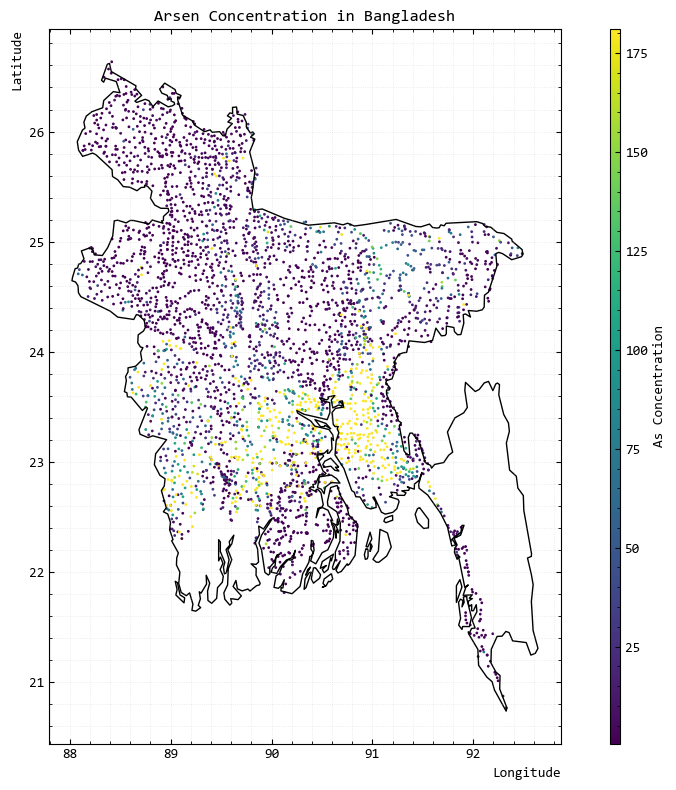

In [69]:
fig, ax = plt.subplots(figsize=(10, 8))
gdf_plot = dg.plot(column='As', cmap='viridis', vmax=np.nanpercentile(dg["As"], 90), vmin=np.nanpercentile(dg["As"], 5), markersize=1, ax=ax)
plt.title('Arsen Concentration in Bangladesh')
shp.plot(ax=gdf_plot, edgecolor='black', facecolor='none')
fig.colorbar(gdf_plot.collections[0], ax=gdf_plot,orientation="vertical",shrink=1,aspect=70,label="As Concentration")
ax.set_xlabel('Longitude',loc="right")
ax.set_ylabel('Latitude',loc="top")
plt.tight_layout()
# ax.set_xticklabels([f'{tick}°' for tick in ax.get_xticks()])
# ax.set_yticklabels([f'{tick}°' for tick in ax.get_yticks()])
plt.show()

In [70]:
gj = shp.to_json()

# Create a Pydeck GeoJsonLayer
poly= pdk.Layer(
        "GeoJsonLayer",
        data=shp,
        get_fill_color=[100,100,100,0],
        get_line_color=[120,120,120,255],  # Border color
        line_width_min_pixels=1.5
    )

# Define a layer to display the points
layer = pdk.Layer(
    'ScatterplotLayer',
    data=dg,
    get_position='[LONG_DEG, LAT_DEG]',
    get_fill_color='[0 + As * 2, 30 + As * 10, 180-As*2, 255]',
    get_radius=1400,
    pickable=True
)

# Set the viewport location
view_state = pdk.ViewState(
    latitude=dg['LAT_DEG'].mean(),
    longitude=dg['LONG_DEG'].mean(),
    zoom=7,
    pitch=0
)

# Render the deck.gl map with a light theme
r = pdk.Deck(
    layers=[poly,layer],
    initial_view_state=view_state,
    map_provider=None,
    height=500,
    tooltip={"text": "{As}"},
    map_style="light_no_labels" 
)
r.to_html('ScatterplotLayer.html',iframe_height=800)

__Coordinate Transformation__

Transform the ellipsoidal coordinates of the dataset into projected (metric) coordinates in adequate regional coordinate system (EPSG:9678 | https://epsg.io/9678)

In [71]:
# Ellipsoidal Coordinates to Metric CRS
main_crs = "EPSG:9678" # https://epsg.io/9678
dg = dg.to_crs(main_crs)
shp = shp.to_crs(main_crs)

__Data Desciption__

In [72]:
# Set the Z Value
z = dg["As"].values


print(f"Min of Z: {z.min()}")
print(f"Max of Z: {z.max()}")
print(f"Mean of Z: {z.mean()}")
print(f"Std of Z: {z.std()}")


Min of Z: 0.5
Max of Z: 1660.0
Mean of Z: 55.27431997660134
Std of Z: 118.66737133921774


### __Variogramm__

In [73]:
# Position Vector of Observations
x_o = dg.get_coordinates().values # [East , North] # m

n_points = len(x_o[:,0])

print(f"n points: {n_points} observations")

n points: 3419 observations


The Semivarinace is defined as followed:

$$
γ(h)=\frac{1}{2N(h)} \sum_{i=1}^{N}(Z(x_i+h)−Z(x_i))^2
$$

- where $h$ is the distance between points in the lag class
- $N(h)$ is the number of points with the distance h (Number of points per lag class).
- $x_i$ is the position of the i-th point and $Z$ is the attribute value at the position $x_i$

_(Benndorf, 2023)_

Benndorf, Jörg. Angewandte Geodatenanalyse und -Modellierung. 2023. Springer Vieweg Wiesbaden. 978-3-658-39981-8. https://doi.org/10.1007/978-3-658-39981-8

In [74]:
# General Settings for the variograms
n_bins = 60
select_max_dist = 90 # %

In [75]:
# Function Definition Variogram
## TODO Implement the mean as max range parameter
def semivariance(x_o,z,n_bins,max_dist_percent = 100):
    """
    Calculate the semivariance gamma(h) for a given set of coordinates and attribute values.

    Parameters:
    x_o : numpy.ndarray
        Array of shape (n_points, 2) containing the coordinates of the observation points.
    z : numpy.ndarray
        Array of shape (n_points,) containing the attribute values at the observation points.
    n_bins : int
        Number of bins to use for the histogram of distances.
    max_dist_percent : int
        Maximum distance percentile to consider for the semivariance calculation.

    Returns:
    semi_var : numpy.ndarray
        Array containing the calculated semivariance for each lag class.
    h_bin_centers : numpy.ndarray
        Array containing the mean lag distance for each class.
    """
    
    ## Positions
    dists = np.linalg.norm(x_o[:,np.newaxis] - x_o[np.newaxis,:],axis=-1) # All Distances between all points
    # Histogramm
    hist, bin_edges = np.histogram(dists,n_bins,range=(0,np.percentile(dists,max_dist_percent)))
    # Mean Lag h in each class
    h_bin_centers = (bin_edges[1:]+bin_edges[:-1])/2

    ## Z Values
    z_diff = z[:,np.newaxis] - z[np.newaxis,:]
    # Print out some information
    print("Max used distance:",round(np.percentile(dists,80)/1000,2),"km ("+str(max_dist_percent)+" %)")
    print(f"Number of Bins n: {n_bins}")

    ## Semivariance (gamma(h))
    semi_var = np.zeros(len(hist)) * np.nan
    for i in range(len(hist)): # Iterate over all lag classes
        
        # Selecting all Z values in the actual Lag Class (h or dist-class)
        diff = z_diff[(dists >= bin_edges[i]) & (dists < bin_edges[i+1])]

        # Count Distances in class
        n = np.sum((dists >= bin_edges[i]) & (dists < bin_edges[i+1]) ) # number of distances in class i
        
        # Semivariance for Class i
        semi_var[i] = 1 / (n*2) * np.sum( diff**2 )

    return semi_var, h_bin_centers

semi_var, h_bin_centers = semivariance(x_o,z,n_bins,max_dist_percent=select_max_dist)


Max used distance: 277.13 km (90 %)
Number of Bins n: 60


### __Theoretical Variogramm and Model Fitting__

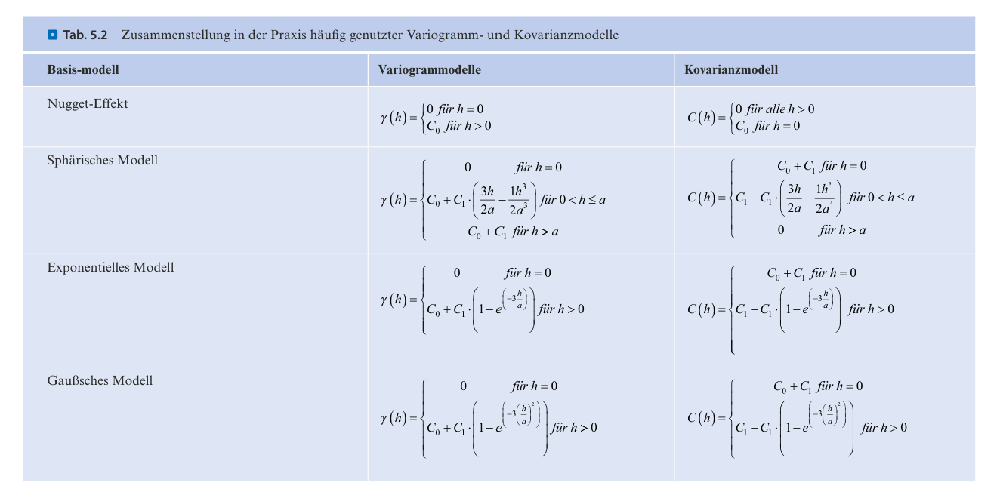

The formula for the spherical variogram model is given by:

$$
\gamma(h) = 
\begin{cases}
0 & \text{if } h = 0 \\
C_0 + C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 \leq h \leq a \\
C_0 + C & \text{if } h > a 
\end{cases}
$$

where:
- $h$ is the lag distance,
- $C_0$ is the nugget,
- $C$ is the sill minus the nugget,
- $a$ is the range.

Modified formula to include $C_0$ fo $h=0$ (Wieder rausgenommen wegen theorie zu Covarinace)

In [ ]:
def spherical(h, c0, c, a):
    semivar = np.zeros_like(h)
    mask0 = h == 0
    mask1 = (h >0 ) & (h <= a)
    mask2 = h > a
    semivar[mask0] = 0
    semivar[mask1] = c0 + c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    semivar[mask2] = c0 + c
    return semivar


def spherical_cov(h, c0, c, a):
    covariance = np.zeros_like(h)
    mask1 = (h > 0 ) & (h <= a)
    mask2 = h == 0
    covariance[mask1] = c - c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
    covariance[mask2] = c0 + c # Nugget effect
    # covariance for h > a is already Zero due to covariance initalization as zeros_like
    return covariance


## Model Fitting

x = h_bin_centers[1:] # Drop first element to remove peak/disturbance
y = semi_var[1:]
# TODO hinzufügen von bounds wie in https://scikit-gstat.readthedocs.io/en/latest/technical/fitting.html

p0 = [0, np.mean(semi_var), np.mean(x_o[:,0])]

cof_u, cov = curve_fit(spherical, x, y,p0 = p0 )

print(f"Nugget (C_0): {cof_u[0]:.2f}")
print(f"Sill (C_1): {cof_u[1]:.2f}")
print(f"Range (a): {cof_u[2]:.2f}")
print(f"max Var: {cof_u[0]+cof_u[1]:.2f}")

# Nugget (C_0): 8601.35
# Sill (C_1): 5784.13
# Range (a): 71833.55
# max Var: 14385.49

Nugget (C_0): 8601.37
Sill (C_1): 5784.12
Range (a): 71833.90
max Var: 14385.49


__Covariance__

The Covariance is derived from the Semivariance:

$$
Cov(h) = 
\begin{cases} 
C_0 + C & \text{if } h = 0 \\
C - C \left[ \frac{3h}{2a} - \frac{1}{2} \left( \frac{h}{a} \right)^3 \right] & \text{if } 0 < h \leq a \\
0 & \text{if } h > a 
\end{cases}
$$

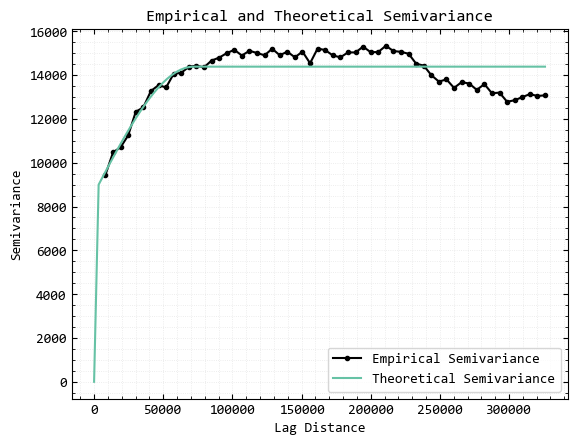

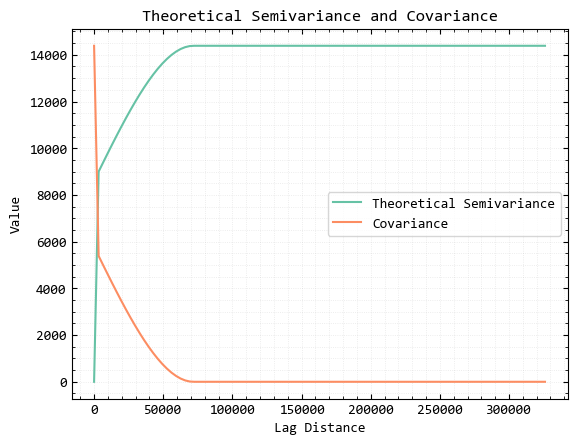

In [77]:
# Plot Spherical Model
h_theo = np.linspace(0,h_bin_centers.max(),100)
semivar_theo = spherical(h_theo,cof_u[0],cof_u[1],cof_u[2])

cov = spherical_cov(h_theo,cof_u[0],cof_u[1],cof_u[2])

plt.plot(h_bin_centers[1:], semi_var[1:], marker='o', ms=3, c="k", label='Empirical Semivariance')
plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.xlabel('Lag Distance')
plt.ylabel('Semivariance')
plt.title('Empirical and Theoretical Semivariance')
plt.legend()
plt.show()


plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
plt.plot(h_theo, cov, label='Covariance')
plt.xlabel('Lag Distance')
plt.ylabel('Value')
plt.title('Theoretical Semivariance and Covariance')
plt.legend()
plt.show()

### __Kriging__

_"Kriging is basically a generalization of minimum mean square error estimation taking into account spatial correlation"_ (B. S. Daya Sagar,Handbook  
of Mathematical 
Geosciences,2018)

__Literature:__
- ArcGis Documentation: https://pro.arcgis.com/en/pro-app/latest/tool-reference/3d-analyst/how-kriging-works.htm
- Gstat: https://scikit-gstat.readthedocs.io/en/latest/userguide/kriging.html
- Handbook of Mathematical Geosciences: https://doi.org/10.1007/978-3-319-78999-6
- Angewandte Geodatenanalyse und -Modellierung: https://doi.org/10.1007/978-3-658-39981-8 





#### __1. Simple Kriging__

__Calculation of weigths__

The Weigths for the Kriging are Calulated via the Covariance for each interpolation point:

$$
\lambda = \mathbf{C^{-1} \cdot c_0}
$$

the matrizes looks like that:



$$
\lambda =
\begin{bmatrix}
    \lambda_1 \\
    \lambda_2 \\
    \vdots \\
    \lambda_2
\end{bmatrix}, \quad
\mathbf{C} =
\begin{bmatrix}
    \text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \cdots & \text{Cov}[x_1, x_n] \\
    \text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \cdots & \text{Cov}[x_2, x_n] \\
    \vdots & \vdots & \ddots & \vdots \\
    \text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \cdots & \text{Cov}[x_n, x_n]
\end{bmatrix}, \quad
\mathbf{c}_0 =
\begin{bmatrix}
    \text{Cov}(x_1, x_0) \\
    \text{Cov}(x_2, x_0) \\
    \vdots \\
    \text{Cov}(x_n, x_0)
\end{bmatrix}
$$


__Simple Kriging Interpolator__

$$
Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + \lambda_m \cdot m
$$

$$with$$

$$
\lambda_m = 1 - \sum_{i=0}^{n} \lambda_i.
$$


If we insert $\lambda_m$ and rewrite:

$$

Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot z(x_i) + 1\cdot m - \sum_{i=0}^{n} \lambda_i \cdot m
$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \sum_{i=0}^{n} \lambda_i \cdot (z(x_i) -m) + m$$

$
\Leftrightarrow  
$
$$Z^*_{SK}(x_0) = \lambda^{T} \cdot (\mathbf{Z} -m) + m$$


_Kriging Resolution_

In [78]:
# Map range Bangladesh
n_range = (x_o[:,1].min(),x_o[:,1].max())
e_range = (x_o[:,0].min(),x_o[:,0].max())

# Interpolation Coords
res = 2000
x_n, x_e = np.mgrid[n_range[0]:n_range[1]:res,e_range[0]:e_range[1]:res]

In [79]:
x_p = np.asarray([x_e.flatten(),x_n.flatten()]) # points of interpolation

x_p = x_p.T # Transverse to make it vertical
# x_p = np.rot90(x_p)

Simple Kriging with Neigborhood Example (Delete in future)


In [80]:
# Find all Obs points inside the max range
max_range = cof_u[2] * 0.5

print(f"Range (a): {cof_u[2]:.2f} m / {cof_u[2]/1000:.2f} km")
print(f"Search range (radius) Kriging: {max_range:.2f} m / {max_range/1000:.2f} km")


Range (a): 71833.90 m / 71.83 km
Search range (radius) Kriging: 35916.95 m / 35.92 km


__Simple Kriging with Neighborhood__

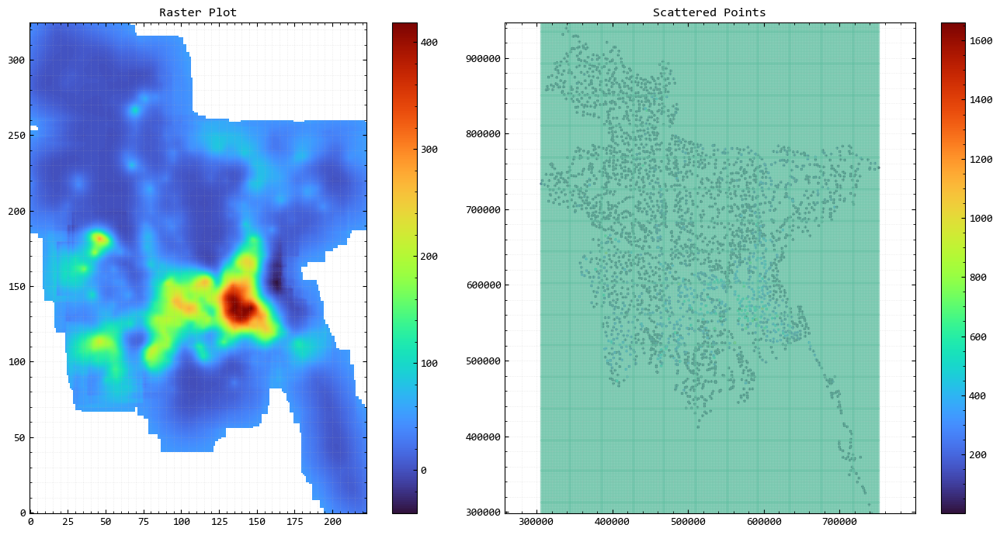

In [81]:
## As function
def simple_kriging(x_o,z,c0,c1,a,max_range_multiplier=1):
    """
        Perform simple kriging interpolation.

        Parameters:
        x_o : numpy.ndarray
            Array of shape (n_points, 2) containing the coordinates of the observation points.
        z : numpy.ndarray
            Array of shape (n_points,) containing the attribute values at the observation points.
        c0 : float
            Nugget effect.
        c1 : float
            Sill minus the nugget.
        a : float
            Range parameter.
        max_range_multiplier : float, optional
            Multiplier for the range parameter to define the neighborhood search radius (default is 1).

        Returns:
        Z_sk : numpy.ndarray
            Array containing the interpolated values at the grid points.
    """

    cof_u = np.array([c0,c1,a])

    max_range = cof_u[2] * max_range_multiplier # set how much of the range (a) is used for the neigborhood search

    m = z.mean() # Mean to detrend Z

    Z_sk = np.empty(x_p.shape[0]) * np.nan
    for i in range(x_p.shape[0]):

        # Select Neigborhod of examination/interpolation Point according to range Parameter
        neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

        # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
        dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
        C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
        
        dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
        c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
        

        # Check if the matrix is singular
        if C.size == 0:
            #print(f"Covariance matrix is empty at index {i}, skipping this point.")
            continue
        if np.linalg.cond(C) < 1/sys.float_info.epsilon:
            lam = np.linalg.solve(C, c_0)
        else:
            #print(f"Matrix is singular at index {i}, skipping this point.")
            #print(np.linalg.cond(C), 1/sys.float_info.epsilon)
            continue

        Z_sk[i] = (lam.T @ (z[neighborhood]-m) ) + m # interpolated value
    
    Z_sk = Z_sk.reshape(x_e.shape)

    return Z_sk

Z_sk = simple_kriging(x_o,z,cof_u[0],cof_u[1],cof_u[2],max_range_multiplier=0.5)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()

#### __2. Ordinary Kriging__

Ordinary Kringing with:


$$
\sum_{i=0}^{n} \lambda_i \overset{!}{=} 1
$$

The Matrix form with the condition:

$$
\lambda =
\begin{bmatrix}
\lambda_1 \\
\lambda_2 \\
\vdots \\
\lambda_n \\
\mu_{OK}
\end{bmatrix},
\quad
\mathbf{C} =
\begin{bmatrix}
\text{Cov}[x_1, x_1] & \text{Cov}[x_1, x_2] & \dots & \text{Cov}[x_1, x_n] & 1 \\
\text{Cov}[x_2, x_1] & \text{Cov}[x_2, x_2] & \dots & \text{Cov}[x_2, x_n] & 1 \\
\vdots & \vdots & \ddots & \vdots & \vdots \\
\text{Cov}[x_n, x_1] & \text{Cov}[x_n, x_2] & \dots & \text{Cov}[x_n, x_n] & 1 \\
1 & 1 & \dots & 1 & 0
\end{bmatrix},
\quad
\mathbf{C_0} =
\begin{bmatrix}
\text{Cov}(x_1, x_0) \\
\text{Cov}(x_2, x_0) \\
\vdots \\
\text{Cov}(x_n, x_0) \\
1
\end{bmatrix}
$$


__Ordinary Kriging Interpolator__


...

Try to optimize with numba

In [82]:

# from numba import njit

# @njit
# def spherical_cov_fast(dists, c0, c1, a):
#     """Spherical covariance model."""
#     h = dists / a
#     cov = np.where(h < 1, c0 + c1 * (1 - 1.5 * h + 0.5 * h**3), c0)
#     return cov
# ## Gitb anderen Output


# # @njit
# # def spherical_cov_fast(h, c0, c, a):
# #     covariance = np.zeros_like(h)
# #     mask1 = (h > 0 ) & (h <= a)
# #     mask2 = h == 0
# #     covariance[mask1] = c - c * (3 * h[mask1] / (2 * a) - 0.5 * (h[mask1] / a) ** 3)
# #     covariance[mask2] = c0 + c # Nugget effect
# #     # covariance for h > a is already Zero due to covariance initalization as zeros_like
# #     return covariance


# @njit
# def eucl_distances(x1, x2):
#     """Compute the Euclidean distances between two sets of points."""
#     n1 = x1.shape[0]
#     n2 = x2.shape[0]
#     dists = np.empty((n1, n2))
#     for i in range(n1):
#         for j in range(n2):
#             dists[i, j] = np.sqrt((x1[i, 0] - x2[j, 0])**2 + (x1[i, 1] - x2[j, 1])**2)
#     return dists


# def ordenary_kriging_fast(x_o, z, x_p,  c0, c1, a, max_range_multiplier=1):
#     """
#     Perform Ordinary Kriging interpolation.

#     Parameters:
#     x_o : numpy.ndarray
#         Array of observation points coordinates with shape (n_points, 2).
#     z : numpy.ndarray
#         Array of observed values at the observation points.
#     c0 : float
#         Nugget effect.
#     c1 : float
#         Sill minus the nugget.
#     a : float
#         Range parameter.
#     x_p : numpy.ndarray
#         Array of grid points coordinates with shape (n_points, 2).
#     x_e : numpy.ndarray
#         Shape of the output grid.
#     max_range_multiplier : float, optional
#         Multiplier for the range parameter to define the neighborhood search radius (default is 1).

#     Returns:
#     numpy.ndarray
#         Interpolated values at the grid points with the same shape as the input grid.
#     """
#     cof_u = np.array([c0, c1, a])
#     max_range = cof_u[2] * max_range_multiplier  # set how much of the range (a) is used for the neighborhood search

#     Z_ok = np.empty(x_p.shape[0]) * np.nan
#     mu = np.empty(x_p.shape[0]) * np.nan

#     for i in range(x_p.shape[0]):
#         # Select Neighborhood of examination/interpolation Point according to range Parameter
#         neighborhood = ((x_o[:, 0] <= (x_p[i, 0] + max_range)) & (x_o[:, 0] >= (x_p[i, 0] - max_range))) & \
#                        ((x_o[:, 1] <= (x_p[i, 1] + max_range)) & (x_o[:, 1] >= (x_p[i, 1] - max_range)))  # mask for x & y

#         # Calculate Dists and Covariance for selected Neighborhoods and Interpolation Point
#         # dists = np.linalg.norm(x_o[neighborhood, np.newaxis] - x_o[np.newaxis, neighborhood], axis=-1)
#         dists = eucl_distances(x_o[neighborhood], x_o[neighborhood])

#         C = spherical_cov_fast(dists, cof_u[0], cof_u[1], cof_u[2])
#         C_cond = np.ones((C.shape[0] + 1, C.shape[1] + 1))
#         C_cond[:-1, :-1] = C
#         C_cond[-1, -1] = 0

#         dists_p = eucl_distances(x_o[neighborhood], x_p[i:i+1])[:, 0]  # Distances to interpolation point (Point in grid)
#         c_0 = spherical_cov_fast(dists_p, cof_u[0], cof_u[1], cof_u[2])  # Covariance between interpolation point and all Data Points
#         c_0_cond = np.ones((c_0.shape[0] + 1))
#         c_0_cond[:-1] = c_0

#         # Check if the matrix is singular
#         if C.size == 0:
#             continue
#         if np.linalg.cond(C) < 1 / np.finfo(C.dtype).eps:
#             lam_mu = np.linalg.solve(C_cond, c_0_cond)
#         else:
#             continue

#         mu[i] = lam_mu[-1]  # Last element is Lagrange multiplier
#         Z_ok[i] = lam_mu[:-1].T @ z[neighborhood]  # interpolated value

#     return Z_ok

# # Example usage
# # Z_ok = ordenary_kriging(x_o, z, cof_u[0], cof_u[1], cof_u[2], x_p, x_e, max_range_multiplier=1)

In [118]:

# Z_ok = ordenary_kriging_fast(x_o[:10,:],z[:10],x_p[:10],cof_u[0],cof_u[1],cof_u[2],max_range_multiplier=0.8)

# Z_ok = ordenary_kriging_fast(x_o,z,x_p,cof_u[0],cof_u[1],cof_u[2],max_range_multiplier=0.8)


# Z_ok = Z_ok.reshape(x_e.shape)


# fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# # Plot the raster on the left
# im = ax[0].imshow(Z_ok, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
# fig.colorbar(im, ax=ax[0])
# ax[0].set_title('Raster Plot')

# # Plot the scattered points on the right
# sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
# ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
# ax[1].set_title('Scattered Points')
# plt.colorbar(sc,ax=ax[1])
# ax[1].axis("equal")
# ax[1].set_xlim(e_range)
# ax[1].set_ylim(n_range)

# plt.tight_layout()
# plt.show()

In [ ]:
def ordenary_kriging(x_o,z,c0,c1,a,max_range_multiplier=1):

    """
    Perform Ordinary Kriging interpolation.

    Parameters:
    x_o : numpy.ndarray
        Array of observation points coordinates with shape (n_points, 2).
    z : numpy.ndarray
        Array of observed values at the observation points.
    c0 : float
        Nugget effect.
    c1 : float
        Sill minus the nugget.
    a : float
        Range parameter.
    max_range_multiplier : float, optional
        Multiplier for the range parameter to define the neighborhood search radius (default is 1).

    Returns:
    numpy.ndarray
        Interpolated values at the grid points with the same shape as the input grid.
    """

    cof_u = np.array([c0,c1,a])

    max_range = cof_u[2] * max_range_multiplier # set how much of the range (a) is used for the neigborhood search

    Z_ok = np.empty(x_p.shape[0]) * np.nan
    Z_ok_var = np.empty(x_p.shape[0]) * np.nan
    mu = np.empty(x_p.shape[0]) * np.nan
    for i in range(x_p.shape[0]):

        # Select Neigborhod of examination/interpolation Point according to range Parameter
        neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

        # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
        dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
        C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
        C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
        C_cond[:-1,:-1] = C
        C_cond[-1,-1] = 0

        dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
        c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
        c_0_cond = np.ones((c_0.shape[0]+1))
        c_0_cond[:-1] = c_0

        # Check if the matrix is singular
        if C.size == 0:
            #print(f"Covariance matrix is empty at index {i}, skipping this point.")
            continue
        if np.linalg.cond(C) < 1/sys.float_info.epsilon:
            lam_mu = np.linalg.solve(C_cond, c_0_cond)
        else:
            print(f"Matrix is singular at index {i}, skipping this point.")
            print(np.linalg.cond(C), 1/sys.float_info.epsilon)
            continue
        
        mu[i] = lam_mu[-1] # Last element is lagrange multiplicator

        Z_ok[i] = lam_mu[:-1].T @ z[neighborhood]  # interpolated value
        Z_ok_var[i] = cof_u[0] + cof_u[1] - lam_mu[:-1].T @ c_0
 
    Z_ok = Z_ok.reshape(x_e.shape)

    return Z_ok, Z_ok_var


Z_ok, Z_ok_var = ordenary_kriging(x_o,z,cof_u[0],cof_u[1],cof_u[2],max_range_multiplier=0.5)



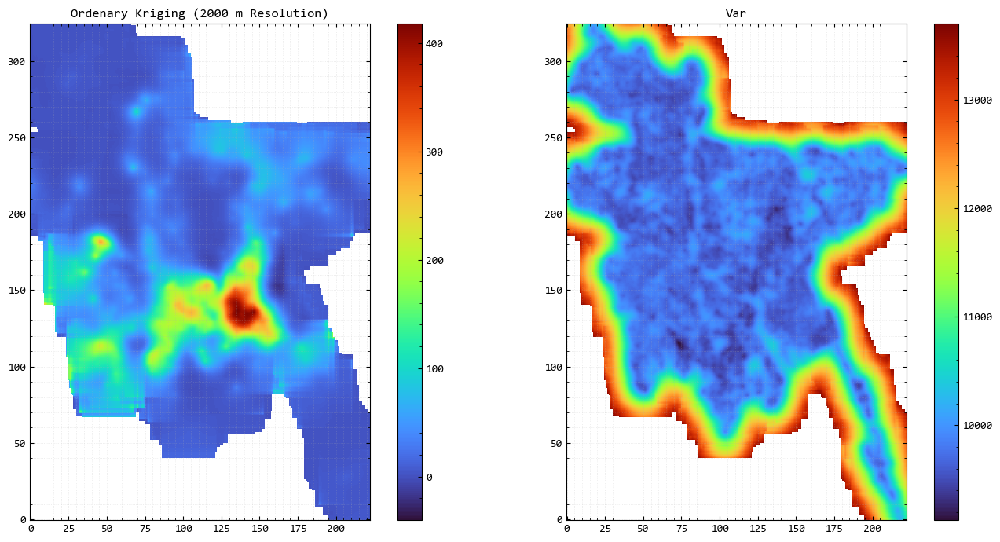

In [117]:
fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_ok, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title("Ordenary Kriging (" + str(res) + " m Resolution)")

# Plot the scattered points on the right
im = ax[1].imshow(Z_ok_var.reshape(x_e.shape), origin="lower",cmap="turbo")
ax[1].set_title('Var')
plt.colorbar(im,ax=ax[1])

plt.tight_layout()
plt.show()

#### __3. Indikator Kriging__

A.G. Journel, 1983, "Nonparametric estimation of spatial distributions", https://link.springer.com/article/10.1007/BF01031292

In [25]:
max_percentile = 99 # %%
thresholds = np.linspace(z.min(),np.percentile(z,max_percentile),10)
thresholds = [15,50] # Given


In [26]:
threshold_mask = []
for i in range(len(thresholds)):
    threshold_mask.append( z>=thresholds[i] )
    print(i,len(z>=thresholds[i]),np.sum(z>=thresholds[i]))

0 3419 1289
1 3419 853


Max used distance: 277.13 km (90 %)
Number of Bins n: 60
Nugget (C_0): 0.15
Sill (C_1): 0.10
Range (a): 164502.57
max Var: 0.25


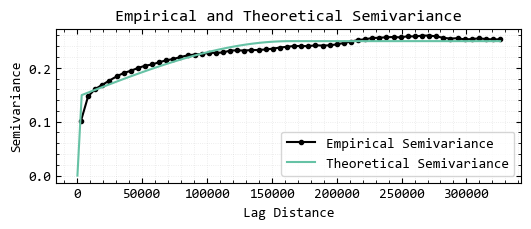

Max used distance: 277.13 km (90 %)
Number of Bins n: 60
Nugget (C_0): 0.11
Sill (C_1): 0.09
Range (a): 129429.23
max Var: 0.20


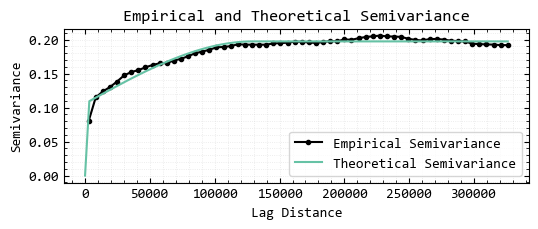

In [27]:
i = 3
z = dg["As"].values

indicator_cofs = []
for i in range(len(thresholds)): # leave out threshold 0
    ## Semivariance
    semi_var, h_bin_centers = semivariance(x_o,threshold_mask[i].astype(int),n_bins,max_dist_percent=90)

    ## Semivariance Model fitting
    p0 = [0, np.mean(semi_var), np.mean(x_o[:,0])]

    cof_u, cov = curve_fit(spherical, h_bin_centers, semi_var,p0 = p0 )

    indicator_cofs.append(cof_u)

    print(f"Nugget (C_0): {cof_u[0]:.2f}")
    print(f"Sill (C_1): {cof_u[1]:.2f}")
    print(f"Range (a): {cof_u[2]:.2f}")
    print(f"max Var: {cof_u[0]+cof_u[1]:.2f}")

    # Plot Spherical Model
    h_theo = np.linspace(0,h_bin_centers.max(),100)
    semivar_theo = spherical(h_theo,cof_u[0],cof_u[1],cof_u[2])

    cov = spherical_cov(h_theo,cof_u[0],cof_u[1],cof_u[2])

    plt.figure(figsize=(6,2))
    plt.plot(h_bin_centers, semi_var, marker='o', ms=3, c="k", label='Empirical Semivariance')
    plt.plot(h_theo, semivar_theo, label='Theoretical Semivariance')
    plt.xlabel('Lag Distance')
    plt.ylabel('Semivariance')
    plt.title('Empirical and Theoretical Semivariance')
    plt.legend()
    plt.show()



In [28]:
cof_u = indicator_cofs[0]

In [29]:
print(f"Range (a): {cof_u[2]:.2f} m / {cof_u[2]/1000:.2f} km")
print(f"Search range (radius) Kriging: {max_range:.2f} m / {max_range/1000:.2f} km")

Range (a): 164502.57 m / 164.50 km
Search range (radius) Kriging: 35916.95 m / 35.92 km


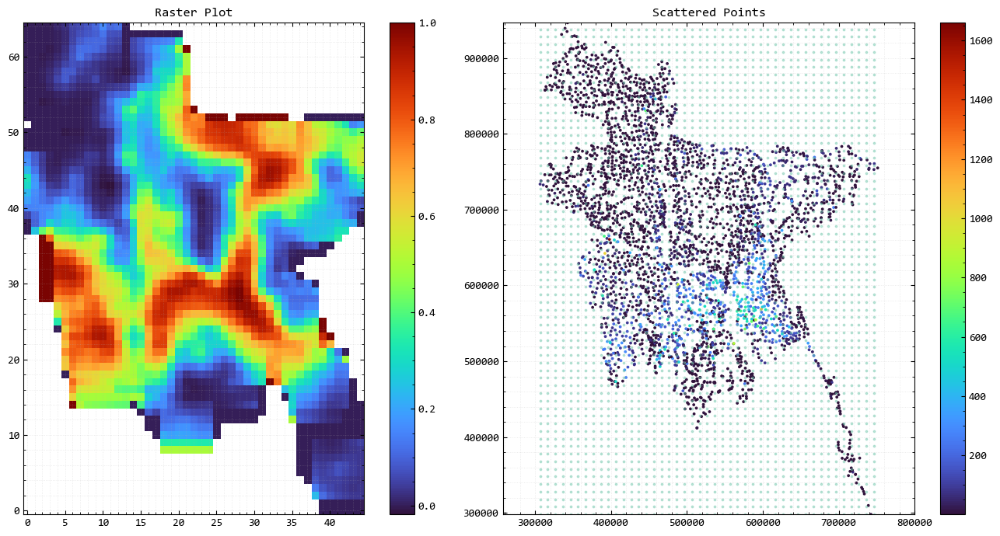

In [33]:
z_indic = (z>=15).astype(int)

Z_sk = np.empty(x_p.shape[0]) * np.nan
mu = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
    C_cond[:-1,:-1] = C
    C_cond[-1,-1] = 0

    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    c_0_cond = np.ones((c_0.shape[0]+1))
    c_0_cond[:-1] = c_0

    
    # Check if the matrix is singular
    if C.size == 0:
        #print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam_mu = np.linalg.solve(C_cond, c_0_cond)
    else:
        print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue
    
    mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
    #print(i,np.sum(lam))

    Z_sk[i] = lam_mu[:-1].T @ z_indic[neighborhood]  # interpolated value



# Reshape
Z_sk = Z_sk.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


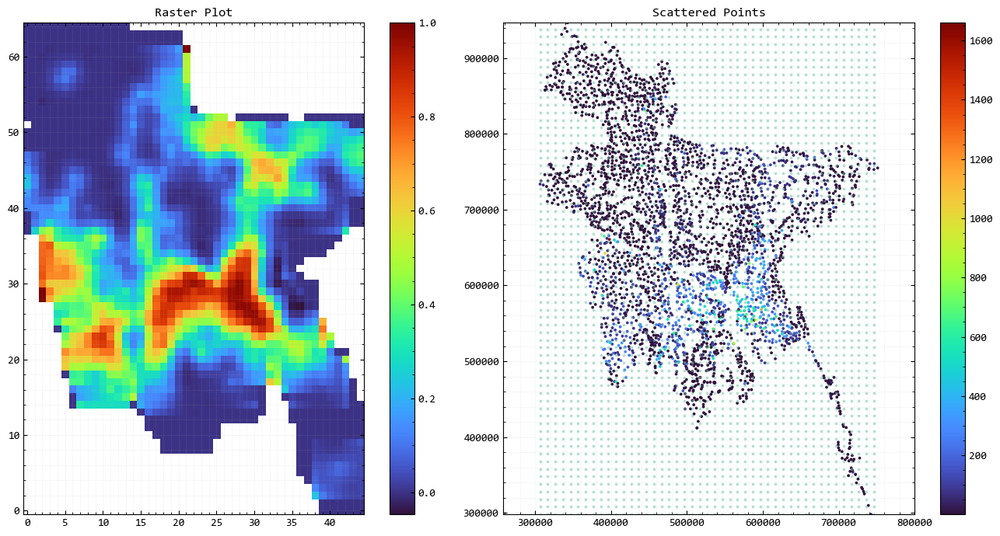

In [31]:
cof_u = indicator_cofs[1]
z_indic = (z>=50).astype(int)

Z_sk = np.empty(x_p.shape[0]) * np.nan
mu = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = np.linalg.norm(x_o[neighborhood,np.newaxis] - x_o[np.newaxis,neighborhood],axis=-1)
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
    C_cond[:-1,:-1] = C
    C_cond[-1,-1] = 0

    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    c_0_cond = np.ones((c_0.shape[0]+1))
    c_0_cond[:-1] = c_0

    
    # Check if the matrix is singular
    if C.size == 0:
        #print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    if np.linalg.cond(C) < 1/sys.float_info.epsilon:
        lam_mu = np.linalg.solve(C_cond, c_0_cond)
    else:
        #print(f"Matrix is singular at index {i}, skipping this point.")
        print(np.linalg.cond(C), 1/sys.float_info.epsilon)
        continue
    
    mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
    #print(i,np.sum(lam))

    Z_sk[i] = lam_mu[:-1].T @ z_indic[neighborhood]  # interpolated value



# Reshape
Z_sk = Z_sk.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


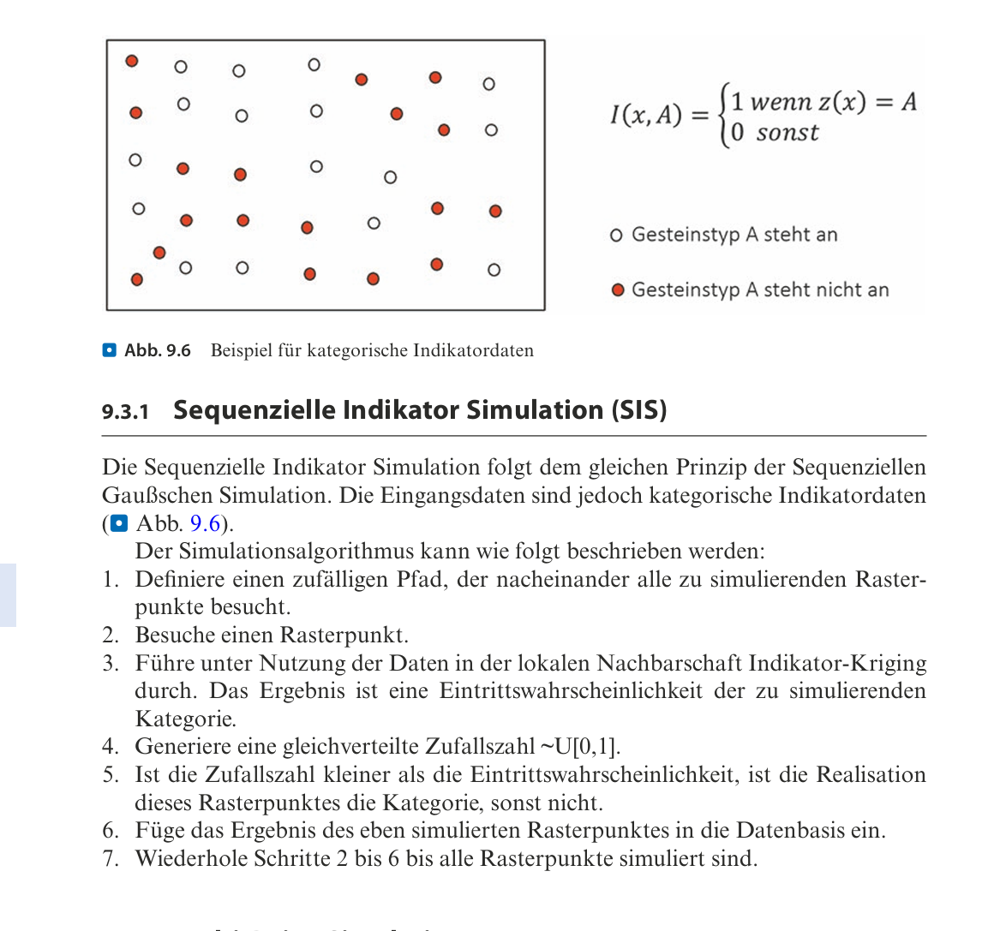

In [32]:
cof_u = indicator_cofs[0]
Z_ok = ordenary_kriging(x_o,(z>=15).astype(int),cof_u[0],cof_u[1],cof_u[2],max_range_multiplier=0.5)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_ok, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

In [ ]:
for i in range(len(thresholds)):
    cof_u = indicator_cofs[i]
    Z_ok = ordenary_kriging(x_o,threshold_mask[i].astype(int),cof_u[0],cof_u[1],cof_u[2])

    fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

    # Plot the raster on the left
    im = ax[0].imshow(Z_ok, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
    fig.colorbar(im, ax=ax[0])
    ax[0].set_title('Raster Plot')

    # Plot the scattered points on the right
    sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
    ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
    ax[1].set_title('Scattered Points')
    plt.colorbar(sc,ax=ax[1])
    ax[1].axis("equal")
    ax[1].set_xlim(e_range)
    ax[1].set_ylim(n_range)

    plt.tight_layout()
    plt.show()

C:\Users\Florian\AppData\Local\Temp\ipykernel_17308\150369747.py:29: RuntimeWarning: invalid value encountered in multiply
  Z_ok = np.empty(x_p.shape[0]) * np.nan
C:\Users\Florian\AppData\Local\Temp\ipykernel_17308\150369747.py:30: RuntimeWarning: invalid value encountered in multiply
  mu = np.empty(x_p.shape[0]) * np.nan


KeyboardInterrupt: 

In [ ]:
## TODO indicator Kriging functioniert noch nicht. Warum? 
## TODO The Task Mentions Indicator Simulation. What is that? "Specifically, use Indicator Simulation to simulate 100 random fields (for each of the thresholds)"

Indicator Simulation
https://geostatisticslessons.com/lessons/sequentialindicatorsim

....

Try to opt but no numba in main functuion

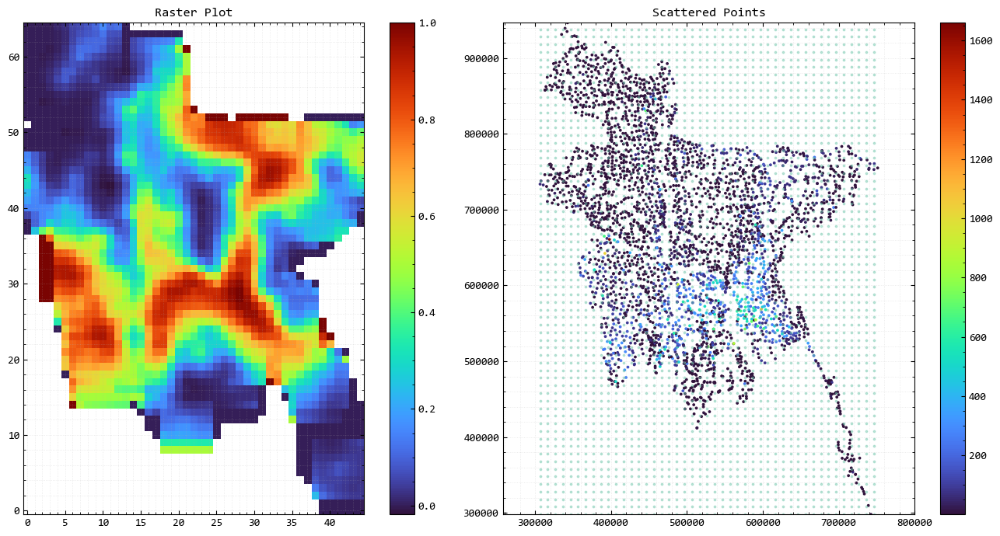

In [39]:

@njit
def eucl_distances(x1, x2):
    """Compute the Euclidean distances between two sets of points."""
    n1 = x1.shape[0]
    n2 = x2.shape[0]
    dists = np.empty((n1, n2))
    for i in range(n1):
        for j in range(n2):
            dists[i, j] = np.sqrt((x1[i, 0] - x2[j, 0])**2 + (x1[i, 1] - x2[j, 1])**2)
    return dists


z_indic = (z>=15).astype(int)

Z_sk = np.empty(x_p.shape[0]) * np.nan
mu = np.empty(x_p.shape[0]) * np.nan
for i in range(x_p.shape[0]):

    # Select Neigborhod of examination/interpolation Point according to range Parameter
    neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

    # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
    dists = eucl_distances(x_o[neighborhood,:],x_o[neighborhood,:])
    C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
    C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
    C_cond[:-1,:-1] = C
    C_cond[-1,-1] = 0

    dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
    c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
    c_0_cond = np.ones((c_0.shape[0]+1))
    c_0_cond[:-1] = c_0

    
    # Check if the matrix is singular
    if C.size == 0:
        #print(f"Covariance matrix is empty at index {i}, skipping this point.")
        continue
    else:
        lam_mu = np.linalg.solve(C_cond, c_0_cond)

    
    mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
    #print(i,np.sum(lam))

    Z_sk[i] = lam_mu[:-1].T @ z_indic[neighborhood]  # interpolated value



# Reshape
Z_sk = Z_sk.reshape(x_e.shape)

fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

# Plot the raster on the left
im = ax[0].imshow(Z_sk, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


In [40]:
x_p.shape[0]

2925

In [ ]:

print(random_path)


[1182 1973 1348 ...  606 2681 1881]


4276350

In [59]:
z_indic = (z>=15).astype(int)

n_sims = 20
kat_bool_all = np.empty((n_sims,x_p.shape[0])) * np.nan
for i_sim in range(n_sims):

    path = np.arange(x_p.shape[0])
    random_path = np.random.permutation(path)

    kat_bool = np.empty(x_p.shape[0]) * np.nan
    mu = np.empty(x_p.shape[0]) * np.nan
    for i in random_path:

        # Select Neigborhod of examination/interpolation Point according to range Parameter
        neighborhood = (  (x_o[:,0] <= (x_p[i,0] + max_range))  & (x_o[:,0] >= (x_p[i,0] - max_range))  )  & (  (x_o[:,1] <= (x_p[i,1] + max_range))  & (x_o[:,1] >= (x_p[i,1] - max_range))   ) # mask for x & y

        # Calculate Dists and Covariance for selected Neigborhouds and Interpolation Point
        dists = eucl_distances(x_o[neighborhood,:],x_o[neighborhood,:])
        C = spherical_cov(dists,cof_u[0],cof_u[1],cof_u[2])
        C_cond = np.ones((C.shape[0]+1,C.shape[1]+1))
        C_cond[:-1,:-1] = C
        C_cond[-1,-1] = 0

        dists_p = np.linalg.norm(x_o[neighborhood,:] - x_p[i,:],axis=-1) # Distances to interpolation point (Point in grid)
        c_0 = spherical_cov(dists_p,cof_u[0],cof_u[1],cof_u[2]) # Covariance between interpolation point an all Data Points
        c_0_cond = np.ones((c_0.shape[0]+1))
        c_0_cond[:-1] = c_0

        
        # Check if the matrix is singular
        if C.size == 0:
            #print(f"Covariance matrix is empty at index {i}, skipping this point.")
            continue
        else:
            lam_mu = np.linalg.solve(C_cond, c_0_cond)

        # Generate randióm number from U[0,1]
        random_number = np.random.uniform(0, 1)



        mu[i] = lam_mu[-1] # Last element is lagrange multiplicator
        #print(i,np.sum(lam))

        Z_pre = lam_mu[:-1].T @ z_indic[neighborhood]  # interpolated value

        kat_bool[i] = random_number < Z_pre
    
    kat_bool_all[i_sim,:] = kat_bool



# Reshape



In [60]:
kat_bool_all.mean(axis=0)

array([nan, nan, nan, ..., nan, nan, nan])

In [ ]:
# Plot the raster on the left
im = ax[0].imshow(kat_bool_all.mean(axis=0).reshape(), origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
fig.colorbar(im, ax=ax[0])
ax[0].set_title('Raster Plot')

# Plot the scattered points on the right
sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
ax[1].set_title('Scattered Points')
plt.colorbar(sc,ax=ax[1])
ax[1].axis("equal")
ax[1].set_xlim(e_range)
ax[1].set_ylim(n_range)

plt.tight_layout()
plt.show()


TypeError: Invalid shape (2925,) for image data

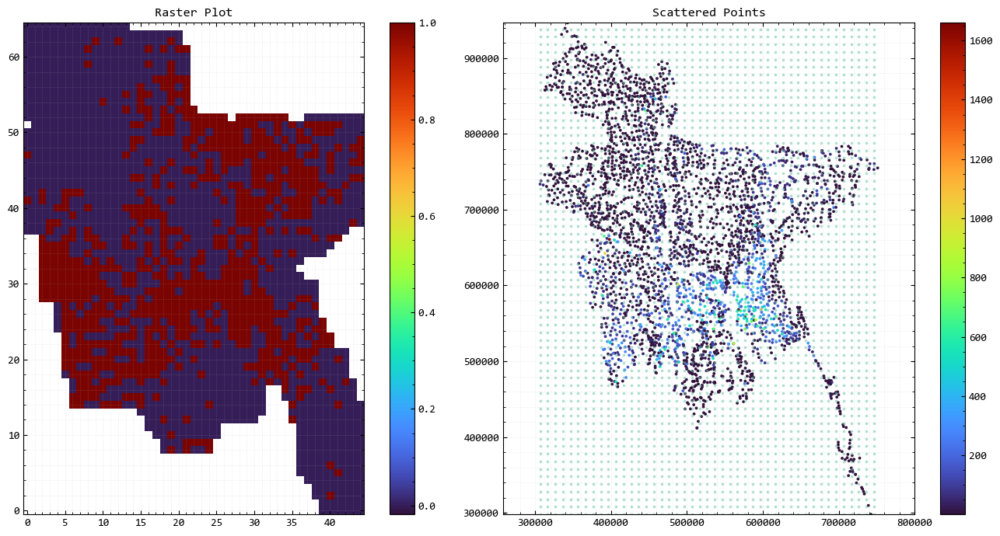

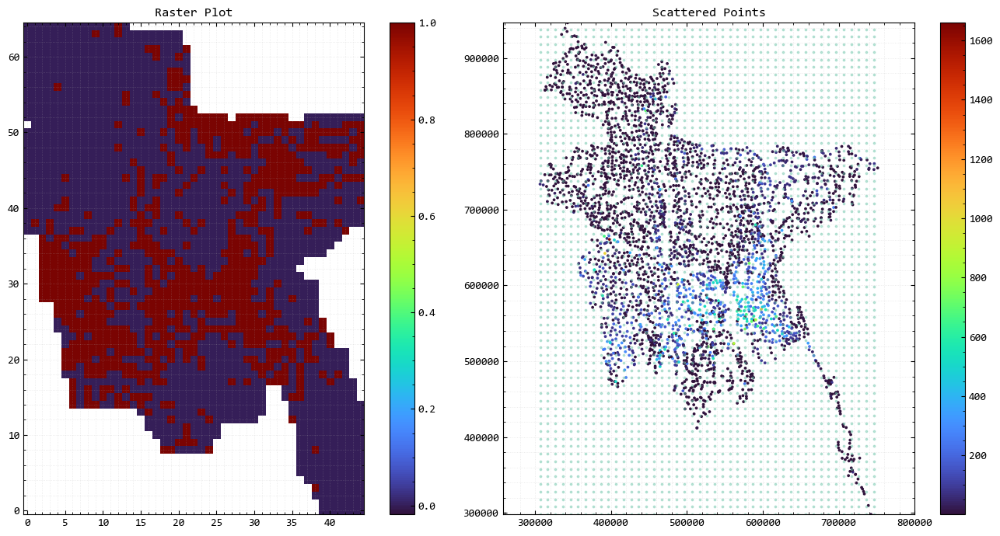

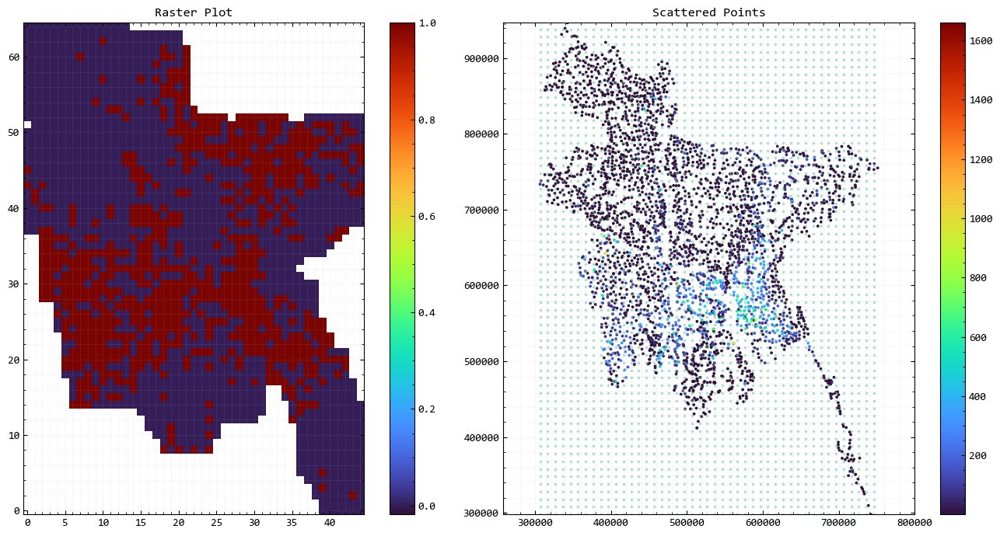

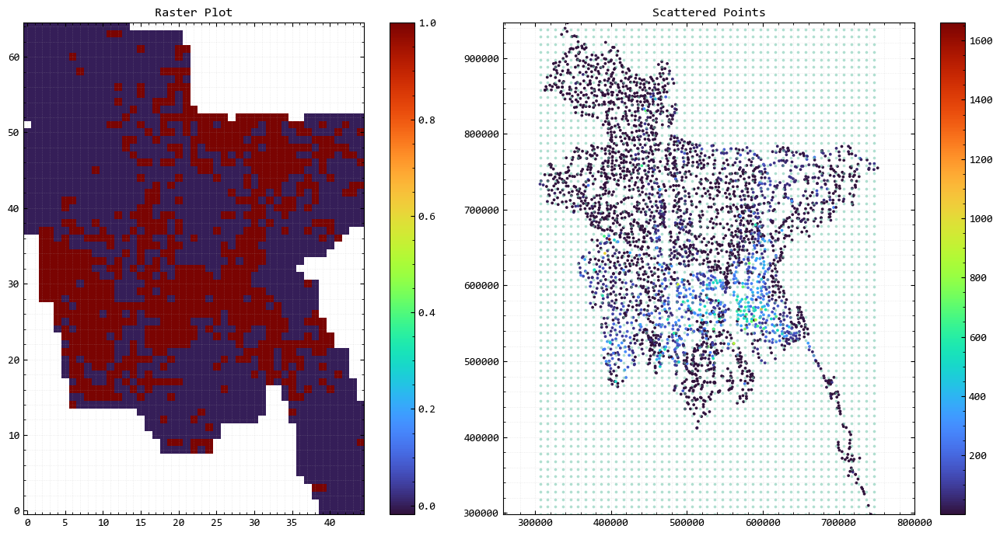

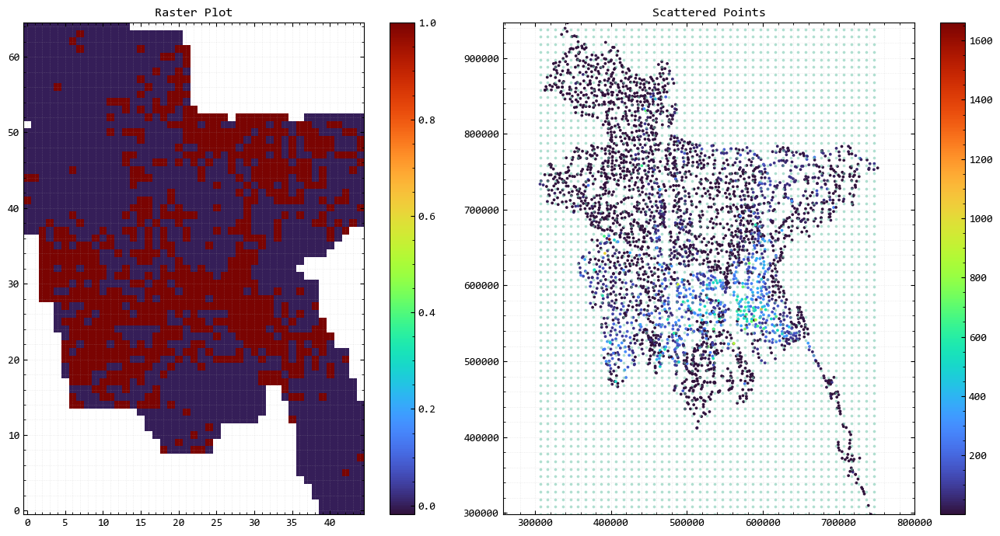

In [56]:
for i in range(5):
    kat_bool = kat_bool_all[i,:].reshape(x_e.shape)

    fig, ax = plt.subplots(ncols=2, figsize=(14, 7))

    # Plot the raster on the left
    im = ax[0].imshow(kat_bool, origin="lower",cmap="turbo", vmin=np.nanpercentile(Z_sk, 0), vmax=np.nanpercentile(Z_sk, 100))
    fig.colorbar(im, ax=ax[0])
    ax[0].set_title('Raster Plot')

    # Plot the scattered points on the right
    sc = ax[1].scatter(x_o[:, 0], x_o[:, 1], s=3,c=z,cmap="turbo")
    ax[1].scatter(x_p[:,0],x_p[:,1],s=3,alpha=0.4)
    ax[1].set_title('Scattered Points')
    plt.colorbar(sc,ax=ax[1])
    ax[1].axis("equal")
    ax[1].set_xlim(e_range)
    ax[1].set_ylim(n_range)

    plt.tight_layout()
    plt.show()